In [1]:
import xarray as xr
import numpy as np
import matplotlib.pylab as plt
import os
import time

In [13]:
ruta = os.getcwd()+'/'

runs  = [ruta+'Mw=9.0/Escenario4/layer01_ts',ruta+'Mw=9.0/Escenario8/layer01_ts',ruta+'Mw=9.0/Escenario3/layer01_ts']
boyas = range(78)   # cantidad total de boyas
lim_boya_valpo = 37  # última boya de valpo
carpeta='Resultados/'
Escenario = 'Mw=9.0-E4-E8-E3/' #modificar según escenarios que compare
fold_eta='eta'
fold_ux='ux'
fold_uy='uy'
fold_mom_x='mom_x'
fold_mom_y='mom_y'
fold_fza='fza'
fold_fza_x='fza_x'
fold_fza_y='fza_y'
if not os.path.exists(carpeta+Escenario+fold_eta): # crea folder si no existe
    os.makedirs(carpeta+Escenario+fold_eta)
if not os.path.exists(carpeta+Escenario+fold_ux): # crea folder si no existe
    os.makedirs(carpeta+Escenario+fold_ux)
if not os.path.exists(carpeta+Escenario+fold_uy): # crea folder si no existe
    os.makedirs(carpeta+Escenario+fold_uy)
if not os.path.exists(carpeta+Escenario+fold_mom_x): # crea folder si no existe
    os.makedirs(carpeta+Escenario+fold_mom_x)
if not os.path.exists(carpeta+Escenario+fold_mom_y): # crea folder si no existe
    os.makedirs(carpeta+Escenario+fold_mom_y)
if not os.path.exists(carpeta+Escenario+fold_fza): # crea folder si no existe
    os.makedirs(carpeta+Escenario+fold_fza)
if not os.path.exists(carpeta+Escenario+fold_fza_x): # crea folder si no existe
    os.makedirs(carpeta+Escenario+fold_fza_x)
if not os.path.exists(carpeta+Escenario+fold_fza_y): # crea folder si no existe
    os.makedirs(carpeta+Escenario+fold_fza_y)
#runs  = [ruta+'Mw=9.5/Escenario7/layer01_ts',ruta+'Mw=9.5/Escenario3/layer01_ts']
#runs  = [ruta+'layer01_ts']
#boyas=[2,3]
#print ruta

In [14]:
#diferencia eta entre escenarios, fza, solo contadores
fold_compara='Mw=9.0_E4vsE8'  #cambiar segùn escenarios que compare, deben estar en los primeros dos argumentos de runs
#if not os.path.exists(carpeta+fold_compara): # crea folder si no existe
 #   os.makedirs(carpeta+fold_compara)

for i in boyas:
    
    dif_eta=[] #dif_eta[Escenario][Altura][boya]
    dif_ux=[]
    dif_uy=[]
    
    dif_fzaE4E8=[]
    #dif_etaE4E3=[]
    #dif_etaE4E1=[]    
    c1=0  #E4 > E8 por más de 1 m
    c2=0 #E4 > E8 por ]0.8-1] m
    c3=0 #E4 > E8 por ]0.6-0.8] m
    c4=0 #E4 > E8 por ]0.4-0.6] m
    c5=0 #E4 > E8 por ]0.2-0.4] m
    c6=0 #E4 > E8 por ]0-0.2] m
    c7=0 #E4 = E8 
    
    c8=0  #E4 < E8 por ]0-0.2] m
    c9=0  #E4 < E8 por ]0.2-0.4] m
    c10=0  #E4 < E8 por ]0.4-0.6] m
    c11=0  #E4 < E8 por ]0.6-0.8] m
    c12=0  #E4 < E8 por ]0.8-1] m
    c13=0  #E4 < E8 por más de 1 m
    
    for j in runs:
        
        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        ux = base.variables['ux'][:].data
        uy = base.variables['uy'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        dif_eta.append(eta)
        dif_ux.append(ux)
        dif_uy.append(uy)
            
    for j in range(10800):
        
        diff_fza1=1.2*(dif_eta[0][j][i]-dif_eta[0][0][i])*(dif_ux[0][j][i]*dif_ux[0][j][i]+dif_uy[0][j][i]*dif_uy[0][j][i])
        diff_fza2=1.2*(dif_eta[1][j][i]-dif_eta[1][0][i])*(dif_ux[1][j][i]*dif_ux[1][j][i]+dif_uy[1][j][i]*dif_uy[1][j][i])
        #diff=(dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[1][j][i]-dif_eta[1][0][i])
        dif_fzaE4E8.append(diff_fza1-diff_fza2)
        #dif_etaE4E3_85.append((dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[2][j][i]-dif_eta[2][0][i]))
        #dif_etaE4E1_85.append((dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[3][j][i]-dif_eta[3][0][i]))
        if dif_fzaE4E8[j]>100:
            c1= c1+1
        if dif_fzaE4E8[j] <= 100 and dif_fzaE4E8[j] > 80:
            c2 = c2+1
        if dif_fzaE4E8[j] <= 80 and dif_fzaE4E8[j] > 60:
            c3=c3+1
        if dif_fzaE4E8[j] <= 60 and dif_fzaE4E8[j] > 40:
            c4=c4+1
        if dif_fzaE4E8[j] <= 40 and dif_fzaE4E8[j] > 20:
            c5=c5+1
        if dif_fzaE4E8[j] <= 20 and dif_fzaE4E8[j] > 0:
            c6=c6+1
        if dif_fzaE4E8[j] == 0:
            c7 = c7+1
        
        if dif_fzaE4E8[j] < 0 and dif_fzaE4E8[j] >= -20:
            c8=c8+1
        if dif_fzaE4E8[j] < -20 and dif_fzaE4E8[j] >= -40:
            c9=c9+1
        if dif_fzaE4E8[j] < -40 and dif_fzaE4E8[j] >= -60:
            c10=c10+1
        if dif_fzaE4E8[j] < -60 and dif_fzaE4E8[j] >= -80:
            c11=c11+1
        if dif_fzaE4E8[j] < -80 and dif_fzaE4E8[j] >= -100:
            c12=c12+1
        if dif_fzaE4E8[j] < -100:
            c13=c13+1
        
        
    if i<=lim_boya_valpo:
        if os.path.isfile(carpeta+'comparacion_tramos_fza_valpo_'+fold_compara+'.txt'):
            comparacion=open(carpeta+'comparacion_tramos_fza_valpo_'+fold_compara+'.txt',"a")
            comparacion.write( str(i)+' '+ str(c1)+' '+str(c2)+' '+str(c3)+' '+str(c4)+' '+str(c5)+' '+str(c6)+' '+str(c7)+' '+str(c8)+' '+str(c9)+' '+str(c10)+' '+str(c11)+' '+str(c12)+' '+str(c13)+'\n')
            #comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','w') 
            comparacion.close()
        else:
            comparacion=open(carpeta+'comparacion_tramos_fza_valpo_'+fold_compara+'.txt','w')
            comparacion.write('Boya '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'porMasde100KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]80-100]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]60-80]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]40-60]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]20-40]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0-20]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'='+fold_compara.split('_')[1].split('vs')[1]+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0-20]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]20-40]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]40-60]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]60-80]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]80-100]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'porMasde100KN'+'\n')
                #comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','a')
            comparacion.write( str(i)+' '+ str(c1)+' '+str(c2)+' '+str(c3)+' '+str(c4)+' '+str(c5)+' '+str(c6)+' '+str(c7)+' '+str(c8)+' '+str(c9)+' '+str(c10)+' '+str(c11)+' '+str(c12)+' '+str(c13)+'\n')
            comparacion.close()
        
    if i > lim_boya_valpo:
        if os.path.isfile(carpeta+'comparacion_tramos_fza_coquimbo_'+fold_compara+'.txt'):
            comparacion=open(carpeta+'comparacion_tramos_fza_coquimbo_'+fold_compara+'.txt',"a")
            comparacion.write( str(i-38)+' '+ str(c1)+' '+str(c2)+' '+str(c3)+' '+str(c4)+' '+str(c5)+' '+str(c6)+' '+str(c7)+' '+str(c8)+' '+str(c9)+' '+str(c10)+' '+str(c11)+' '+str(c12)+' '+str(c13)+'\n')
            #comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','w') 
            comparacion.close()
        else:
            comparacion=open(carpeta+'comparacion_tramos_fza_coquimbo_'+fold_compara+'.txt','w')
            comparacion.write('Boya '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'porMasde100KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]80-100]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]60-80]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]40-60]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]20-40]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0-20]KN'+' '+fold_compara.split('_')[1].split('vs')[0]+'='+fold_compara.split('_')[1].split('vs')[1]+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0-20]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]20-40]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]40-60]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]60-80]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]80-100]KN'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'porMasde100KN'+'\n')
            #comparacion.write('Boya '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+' '+fold_compara.split('_')[1].split('vs')[0]+'='+fold_compara.split('_')[1].split('vs')[1]+'\n')
                #comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','a')
            comparacion.write( str(i-38)+' '+ str(c1)+' '+str(c2)+' '+str(c3)+' '+str(c4)+' '+str(c5)+' '+str(c6)+' '+str(c7)+' '+str(c8)+' '+str(c9)+' '+str(c10)+' '+str(c11)+' '+str(c12)+' '+str(c13)+'\n')
            comparacion.close()



IOError: [Errno 2] No such file or directory: '/home/paula/Documentos/Memoria/HySea/UTFSM-IniciacionTsunami-20200505T151943Z-001/UTFSM-IniciacionTsunami/ejemplo_chile/Escenarios_corridos/Mw=8.5/Escenario17/layer01_ts.nc'

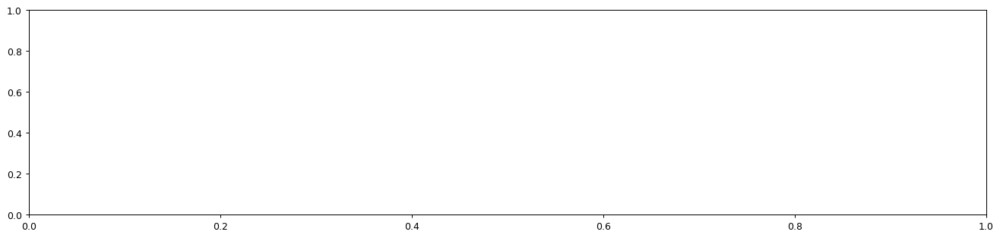

In [29]:
#diferencia eta entre escenarios graficos
fold_compara='Mw=8.5_E4vsE17'  #cambiar segùn escenarios que compare, deben estar en los primeros dos argumentos de runs
if not os.path.exists(carpeta+fold_compara): # crea folder si no existe
    os.makedirs(carpeta+fold_compara)
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure(figsize=(14,6), dpi=90)
    plt.axes([0, 0, 1, 0.5])
    dif_eta=[] #dif_eta[Escenario][Altura][boya]
    dif_etaE4E8_85=[]
    dif_etaE4E3_85=[]
    dif_etaE4E1_85=[]    
    #contador=0  #cantidad de veces E4 > E8
    #contador2=0  #cantidad de veces E4 < E8
    #contador3=0  #cantidad de veces no hay diferencia
    for j in runs:
        
        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        dif_eta.append(eta)
        for k in range(0,time.shape[0]):
            texto2 = str(time[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
    for j in range(10800):
        
        dif_etaE4E8_85.append((dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[1][j][i]-dif_eta[1][0][i]))
        #dif_etaE4E3_85.append((dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[2][j][i]-dif_eta[2][0][i]))
        #dif_etaE4E1_85.append((dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[3][j][i]-dif_eta[3][0][i]))
     #   if diff>0:
      #      contador = contador+1
       # if diff<0:
        #    contador2 = contador2+1
        #if diff==0:
         #   contador3 = contador3+1
        #print diff
    #print np.size(dif_etaE4E8_85)
    plt.plot(time_i, dif_etaE4E8_85, label='eta '+fold_compara)    
    #plt.plot(time_i, dif_etaE4E3_85, label='eta E4 vs E3') 
    #plt.plot(time_i, dif_etaE4E1_85, label='eta E4 vs E1') 

    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-8,8))

    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+fold_compara)
        plt.xlabel('Tiempo [min]')
        plt.ylabel('diferencia eta [m]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+fold_compara+'/'+'Valpo_eta_Boya_'+str(i)+'_' +fold_compara+ '.png', bbox_inches='tight', dpi=600)
        
       # if not os.path.isfile(carpeta+'valpo_'+fold_compara+'.txt'):
       #     comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','w') 
       # else:
       #     comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','a')
       # comparacion.write('Boya '+str(i)+'las diferencias de eta son: .\n')
       # comparacion.write('La cantidad de veces que '+fold_compara.split('_')[1].split('vs')[0]+' es mayor a '+fold_compara.split('_')[1].split('vs')[1]+'es '+str(contador)+'.\n')
       # comparacion.write('La cantidad de veces que '+fold_compara.split('_')[1].split('vs')[1]+' es mayor a '+fold_compara.split('_')[1].split('vs')[0]+'es '+str(contador2)+'.\n')
       # comparacion.write('La cantidad de veces que '+fold_compara.split('_')[1].split('vs')[0]+' es igual a '+fold_compara.split('_')[1].split('vs')[1]+'es '+str(contador3)+'.\n')
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+fold_compara)
        plt.xlabel('Tiempo [min]')
        plt.ylabel('diferencia eta [m]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+fold_compara+'/'+'Coquimbo_eta_Boya_'+str(i-(lim_boya_valpo+1))+'_'+fold_compara + '.png', bbox_inches='tight', dpi=600)
        
       # if not os.path.isfile(carpeta+'coquimbo_'+fold_compara+'.txt'):
       #     comparacion=open(carpeta+'coquimbo_'+fold_compara+'.txt','w') 
       # else:
       #     comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','a')
       # comparacion.write('Boya '+str(i)+'las diferencias de eta son: .\n')
       # comparacion.write('La cantidad de veces que '+fold_compara.split('_')[1].split('vs')[0]+' es mayor a '+fold_compara.split('_')[1].split('vs')[1]+'es '+str(contador)+'.\n')
       # comparacion.write('La cantidad de veces que '+fold_compara.split('_')[1].split('vs')[1]+' es mayor a '+fold_compara.split('_')[1].split('vs')[0]+'es '+str(contador2)+'.\n')
       # comparacion.write('La cantidad de veces que '+fold_compara.split('_')[1].split('vs')[0]+' es igual a '+fold_compara.split('_')[1].split('vs')[1]+'es '+str(contador3)+'.\n')

    

In [51]:
#diferencia eta entre escenarios, inundación, solo contadores
fold_compara='Mw=9.5_E8vsE13'  #cambiar segùn escenarios que compare, deben estar en los primeros dos argumentos de runs
#if not os.path.exists(carpeta+fold_compara): # crea folder si no existe
 #   os.makedirs(carpeta+fold_compara)

for i in boyas:
    
    dif_eta=[] #dif_eta[Escenario][Altura][boya]

    dif_etaE4E8=[]
    #dif_etaE4E3=[]
    #dif_etaE4E1=[]    
    c1=0  #E4 > E8 por más de 1 m
    c2=0 #E4 > E8 por ]0.8-1] m
    c3=0 #E4 > E8 por ]0.6-0.8] m
    c4=0 #E4 > E8 por ]0.4-0.6] m
    c5=0 #E4 > E8 por ]0.2-0.4] m
    c6=0 #E4 > E8 por ]0-0.2] m
    c7=0 #E4 = E8 
    
    c8=0  #E4 < E8 por ]0-0.2] m
    c9=0  #E4 < E8 por ]0.2-0.4] m
    c10=0  #E4 < E8 por ]0.4-0.6] m
    c11=0  #E4 < E8 por ]0.6-0.8] m
    c12=0  #E4 < E8 por ]0.8-1] m
    c13=0  #E4 < E8 por más de 1 m
    
    for j in runs:
        
        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        dif_eta.append(eta)
                    
    for j in range(10800):
        
        #diff=(dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[1][j][i]-dif_eta[1][0][i])
        dif_etaE4E8.append((dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[1][j][i]-dif_eta[1][0][i]))
        #dif_etaE4E3_85.append((dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[2][j][i]-dif_eta[2][0][i]))
        #dif_etaE4E1_85.append((dif_eta[0][j][i]-dif_eta[0][0][i])-(dif_eta[3][j][i]-dif_eta[3][0][i]))
        if dif_etaE4E8[j]>1.0:
            c1= c1+1
        if dif_etaE4E8[j] <= 1 and dif_etaE4E8[j] > 0.8:
            c2 = c2+1
        if dif_etaE4E8[j] <= 0.8 and dif_etaE4E8[j] > 0.6:
            c3=c3+1
        if dif_etaE4E8[j] <= 0.6 and dif_etaE4E8[j] > 0.4:
            c4=c4+1
        if dif_etaE4E8[j] <= 0.4 and dif_etaE4E8[j] > 0.2:
            c5=c5+1
        if dif_etaE4E8[j] <= 0.2 and dif_etaE4E8[j] > 0:
            c6=c6+1
        if dif_etaE4E8[j] == 0:
            c7 = c7+1
        
        if dif_etaE4E8[j] < 0 and dif_etaE4E8[j] >= -0.2:
            c8=c8+1
        if dif_etaE4E8[j] < -0.2 and dif_etaE4E8[j] >= -0.4:
            c9=c9+1
        if dif_etaE4E8[j] < -0.4 and dif_etaE4E8[j] >= -0.6:
            c10=c10+1
        if dif_etaE4E8[j] < -0.6 and dif_etaE4E8[j] >= -0.8:
            c11=c11+1
        if dif_etaE4E8[j] < -0.8 and dif_etaE4E8[j] >= -1:
            c12=c12+1
        if dif_etaE4E8[j] < -1:
            c13=c13+1
        
        
    if i<=lim_boya_valpo:
        if os.path.isfile(carpeta+'comparacion_tramos_eta_valpo_'+fold_compara+'.txt'):
            comparacion=open(carpeta+'comparacion_tramos_eta_valpo_'+fold_compara+'.txt',"a")
            comparacion.write( str(i)+' '+ str(c1)+' '+str(c2)+' '+str(c3)+' '+str(c4)+' '+str(c5)+' '+str(c6)+' '+str(c7)+' '+str(c8)+' '+str(c9)+' '+str(c10)+' '+str(c11)+' '+str(c12)+' '+str(c13)+'\n')
            #comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','w') 
            comparacion.close()
        else:
            comparacion=open(carpeta+'comparacion_tramos_eta_valpo_'+fold_compara+'.txt','w')
            comparacion.write('Boya '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'porMasde1m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0.8-1]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0.6-0.8]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0.4-0.6]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0.2-0.4]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0-0.2]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'='+fold_compara.split('_')[1].split('vs')[1]+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0-0.2]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0.2-0.4]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0.4-0.6]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0.6-0.8]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0.8-1]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'porMasde1m'+'\n')
                #comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','a')
            comparacion.write( str(i)+' '+ str(c1)+' '+str(c2)+' '+str(c3)+' '+str(c4)+' '+str(c5)+' '+str(c6)+' '+str(c7)+' '+str(c8)+' '+str(c9)+' '+str(c10)+' '+str(c11)+' '+str(c12)+' '+str(c13)+'\n')
            comparacion.close()
        
    if i > lim_boya_valpo:
        if os.path.isfile(carpeta+'comparacion_tramos_eta_coquimbo_'+fold_compara+'.txt'):
            comparacion=open(carpeta+'comparacion_tramos_eta_coquimbo_'+fold_compara+'.txt',"a")
            comparacion.write( str(i-38)+' '+ str(c1)+' '+str(c2)+' '+str(c3)+' '+str(c4)+' '+str(c5)+' '+str(c6)+' '+str(c7)+' '+str(c8)+' '+str(c9)+' '+str(c10)+' '+str(c11)+' '+str(c12)+' '+str(c13)+'\n')
            #comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','w') 
            comparacion.close()
        else:
            comparacion=open(carpeta+'comparacion_tramos_eta_coquimbo_'+fold_compara+'.txt','w')
            comparacion.write('Boya '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'porMasde1m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0.8-1]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0.6-0.8]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0.4-0.6]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0.2-0.4]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+'por]0-0.2]m'+' '+fold_compara.split('_')[1].split('vs')[0]+'='+fold_compara.split('_')[1].split('vs')[1]+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0-0.2]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0.2-0.4]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0.4-0.6]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0.6-0.8]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'por]0.8-1]m'+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+'porMasde1m'+'\n')
            #comparacion.write('Boya '+fold_compara.split('_')[1].split('vs')[0]+'>'+fold_compara.split('_')[1].split('vs')[1]+' '+fold_compara.split('_')[1].split('vs')[1]+'>'+fold_compara.split('_')[1].split('vs')[0]+' '+fold_compara.split('_')[1].split('vs')[0]+'='+fold_compara.split('_')[1].split('vs')[1]+'\n')
                #comparacion=open(carpeta+'valpo_'+fold_compara+'.txt','a')
            comparacion.write( str(i-38)+' '+ str(c1)+' '+str(c2)+' '+str(c3)+' '+str(c4)+' '+str(c5)+' '+str(c6)+' '+str(c7)+' '+str(c8)+' '+str(c9)+' '+str(c10)+' '+str(c11)+' '+str(c12)+' '+str(c13)+'\n')
            comparacion.close()



In [30]:
print len(range(10800))
print fold_compara.split('_')[1].split('vs')[0]


10800
E4


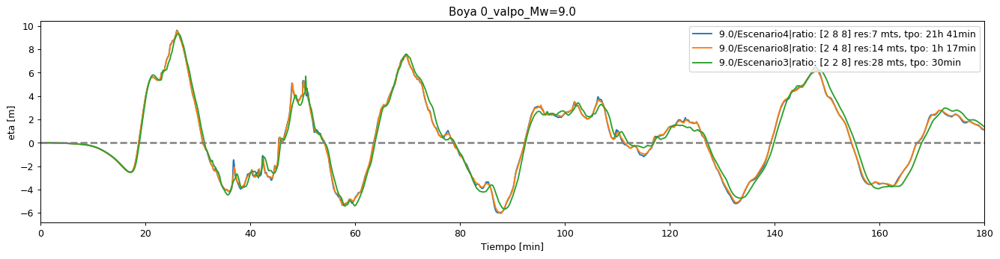

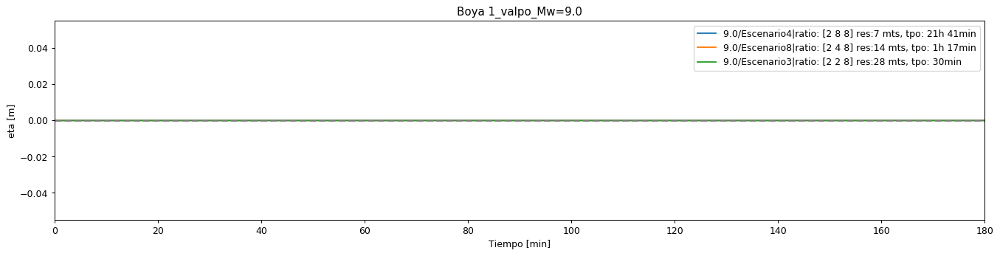

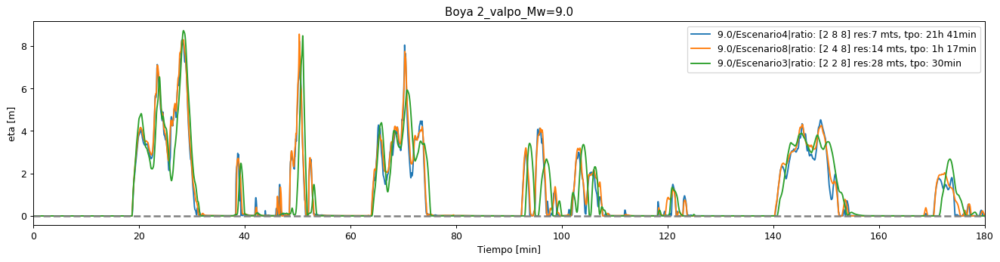

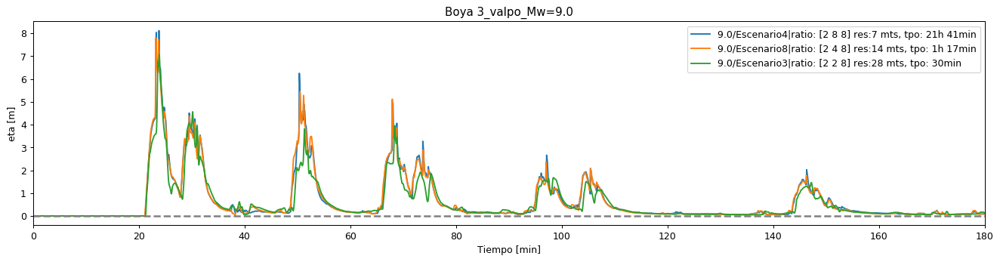

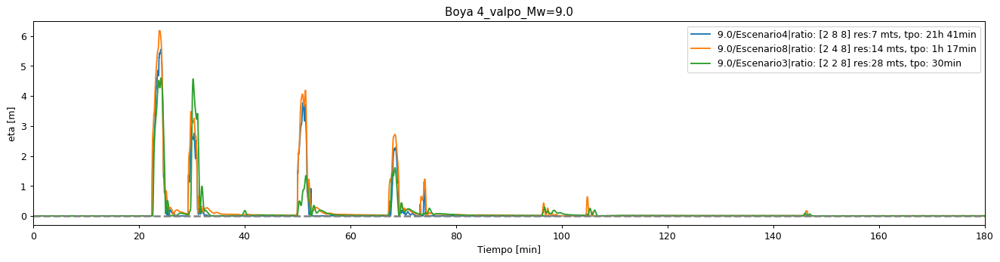

...

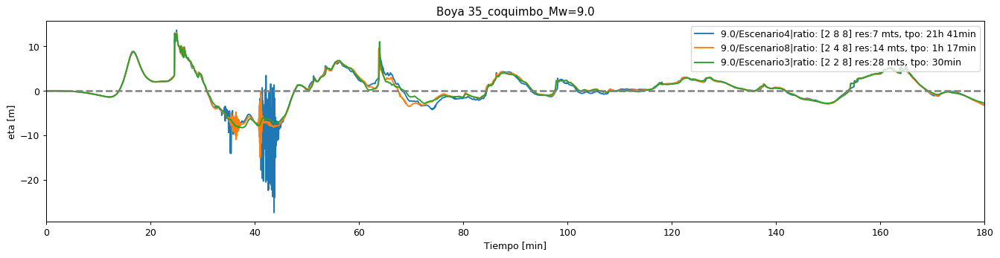

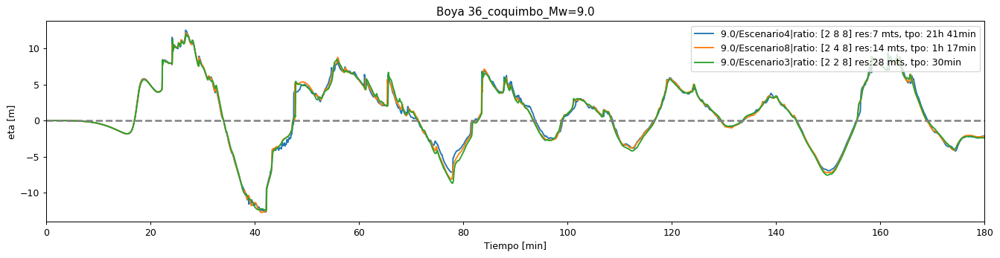

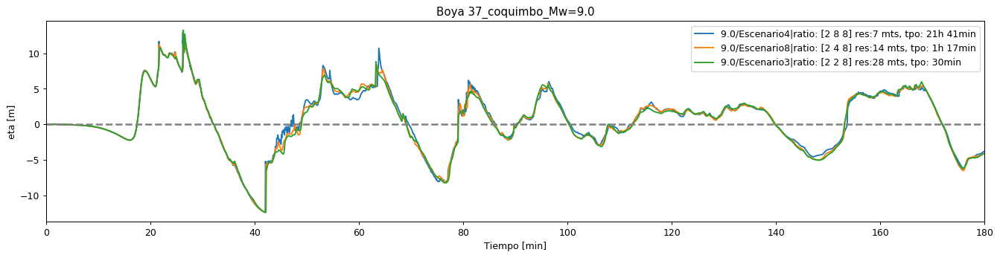

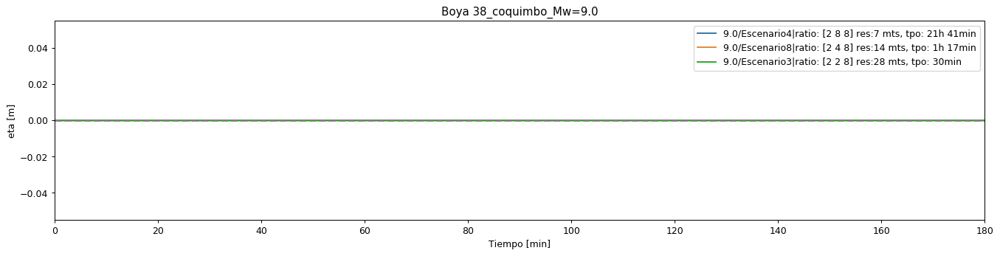

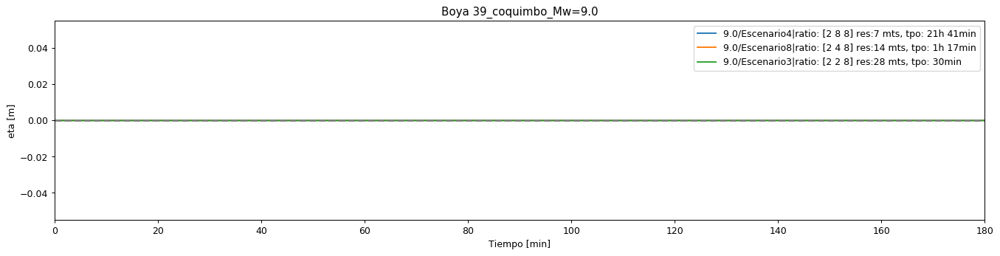

In [19]:
#eta
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure(figsize=(14,6), dpi=90)
    plt.axes([0, 0, 1, 0.5])
    
    for j in runs:
        if j==runs[0]:
            ratio='|ratio: [2 8 8] res:7 mts, tpo: 21h 41min'  #cambiar ratios y resolución según escenarios
        elif j==runs[1]:
            ratio='|ratio: [2 4 8] res:14 mts, tpo: 1h 17min'
        elif j==runs[2]:
            ratio='|ratio: [2 2 8] res:28 mts, tpo: 30min'
        else:
            ratio='|ratio: [2 2 8] res:28 mts, tpo: 30min'
        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        for k in range(0,time.shape[0]):
            texto2 = str(time[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
        plt.plot(time_i, eta[:,i]-eta[:,i][0], label=j.split('=')[1].split('/layer01')[0]+ratio)    
        #plt.plot(time_i, eta[:,i], label=j.split('=')[1].split('/layer01')[0]+ratio)
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-8,8))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('eta [m]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_eta+'/'+'Valpo_eta_Boya_'+str(i)+'_' +Escenario.split('-')[0]+ '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('eta [m]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_eta+'/'+'Coquimbo_eta_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
        
    

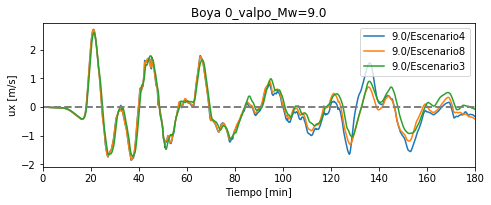

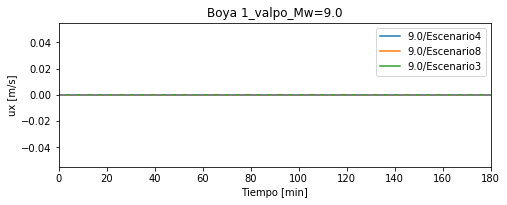

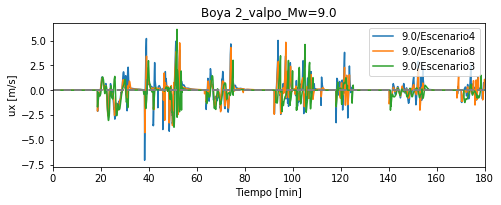

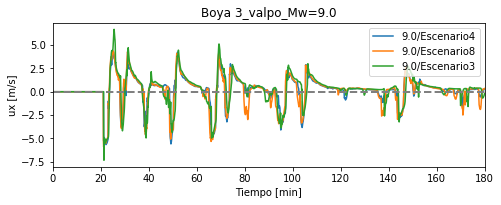

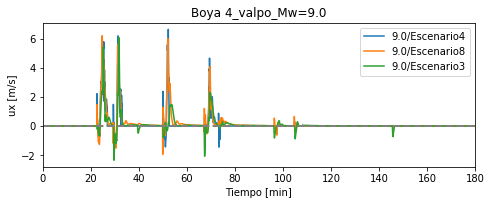

...

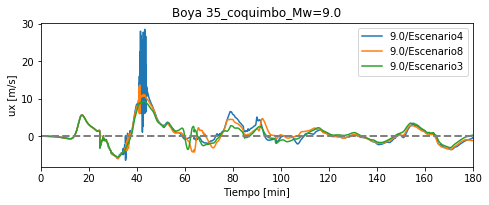

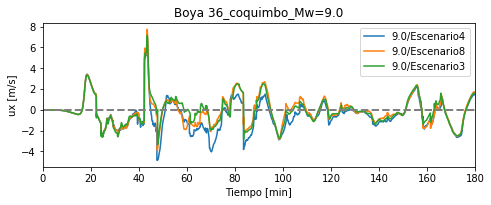

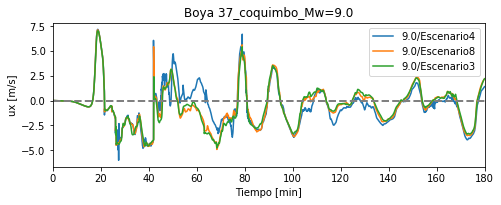

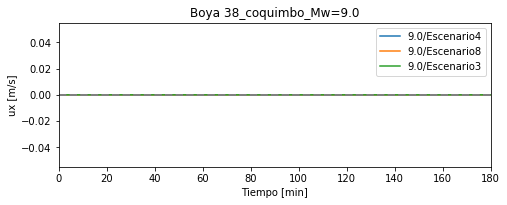

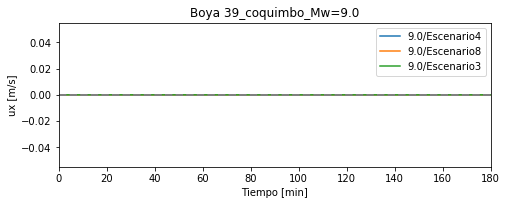

In [20]:
#ux
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['ux'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        for k in range(0,time.shape[0]):
            texto2 = str(time[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        plt.plot(time_i, eta[:,i], label=j.split('=')[1].split('/layer01')[0])
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-5,5))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('ux [m/s]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_ux+'/'+'Valpo_ux_Boya_'+str(i)+'_' +Escenario.split('-')[0]+ '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('ux [m/s]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_ux+'/'+'Coquimbo_ux_Boya_'+str(i-(lim_boya_valpo+1))+'_' +Escenario.split('-')[0]+ '.png', bbox_inches='tight', dpi=600)
        


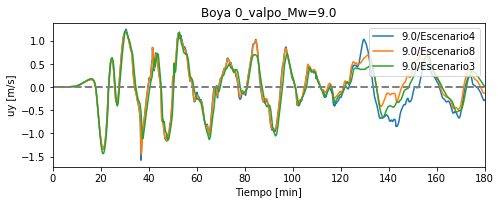

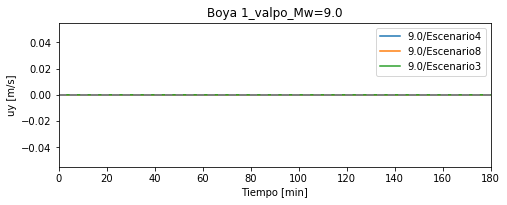

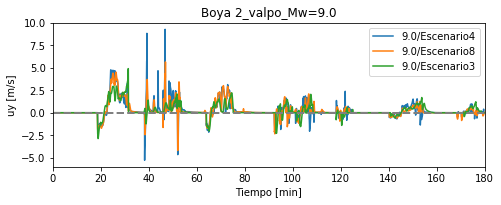

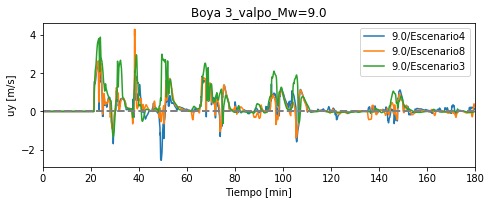

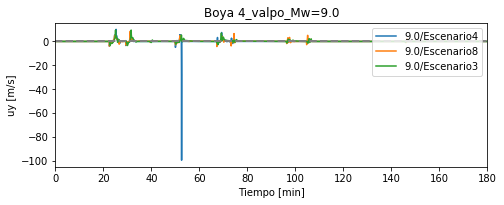

...

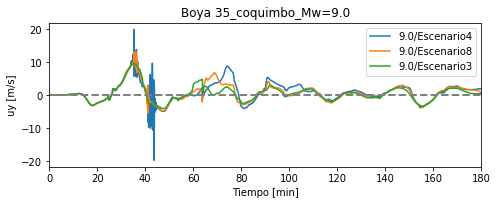

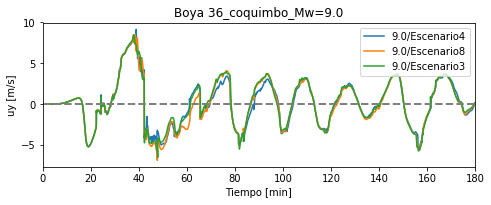

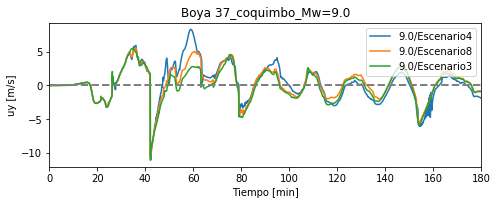

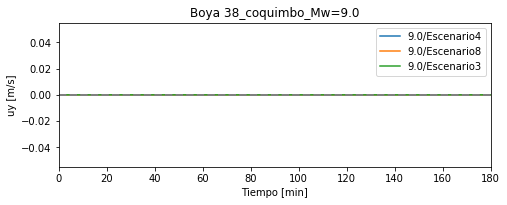

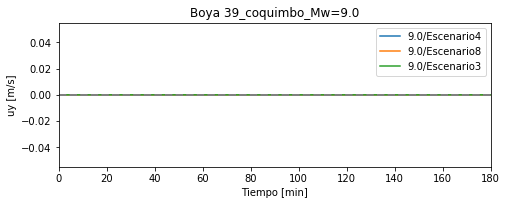

In [21]:
#uy
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['uy'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        for k in range(0,time.shape[0]):
            texto2 = str(time[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        plt.plot(time_i, eta[:,i], label=j.split('=')[1].split('/layer01')[0])
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-4,3))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('uy [m/s]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_uy+'/'+'Valpo_uy_Boya_'+str(i)+'_' +Escenario.split('-')[0]+ '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('uy [m/s]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_uy+'/'+'Coquimbo_uy_Boya_'+str(i-(lim_boya_valpo+1))+'_' +Escenario.split('-')[0]+ '.png', bbox_inches='tight', dpi=600)
        


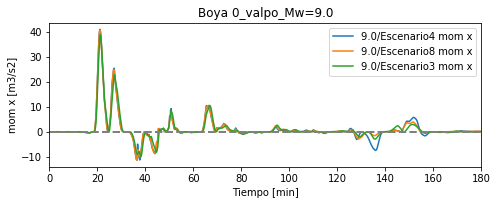

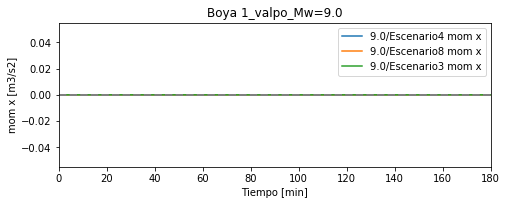

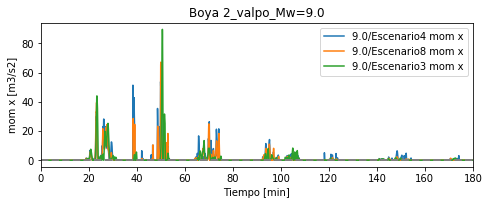

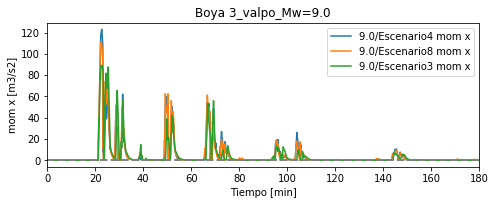

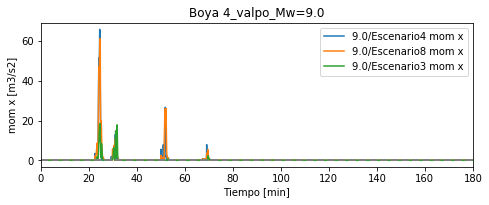

...

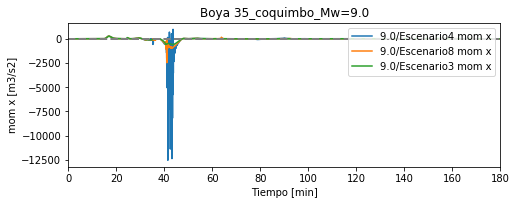

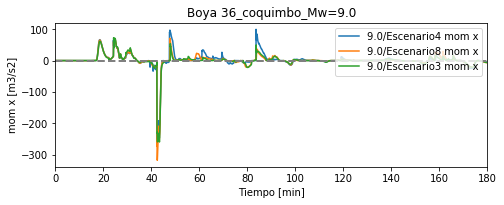

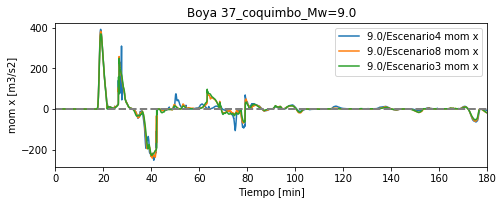

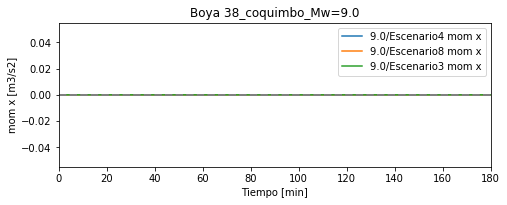

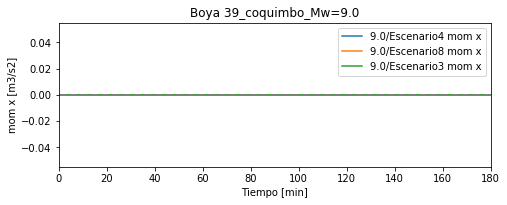

In [22]:
#mom_x
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        ux = base.variables['ux'][:].data
        uy = base.variables['uy'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        for k in range(0,time.shape[0]):
            texto2 = str(time[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        plt.plot(time_i, (eta[:,i]-eta[:,i][0])*ux[:,i]*ux[:,i], label=j.split('=')[1].split('/layer01')[0]+' mom x')
        #plt.plot(time_i, (eta[:,i]-eta[:,i][0])*uy[:,i]*uy[:,i],'--', label=j.split('=')[1].split('/layer01')[0]+'mom y')
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-7,10))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('mom x [m3/s2]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_mom_x+'/'+'Valpo_mom_x_Boya_'+str(i)+'_' +Escenario.split('-')[0]+ '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('mom x [m3/s2]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_mom_x+'/'+'Coquimbo_mom_x_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
        


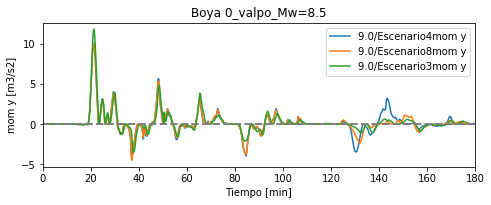

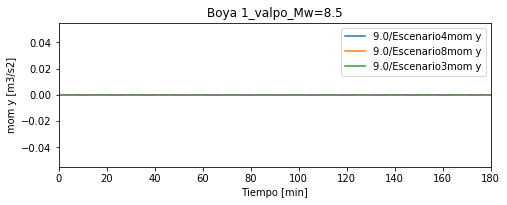

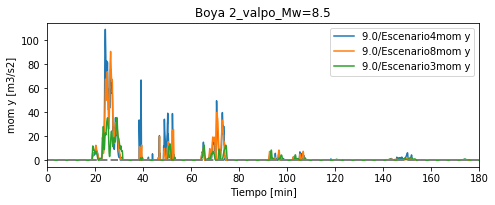

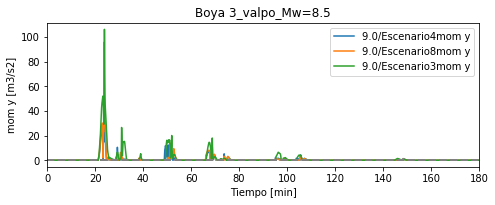

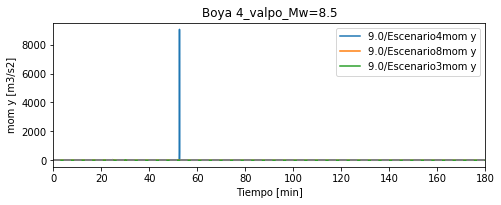

...

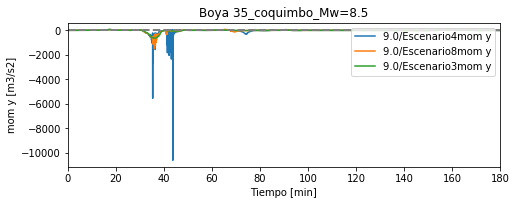

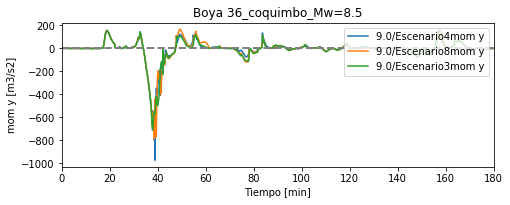

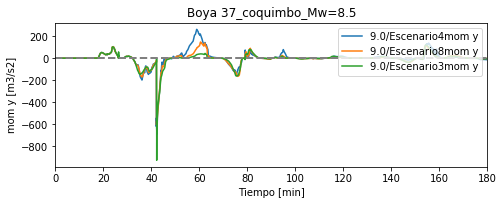

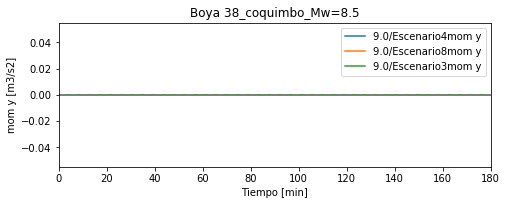

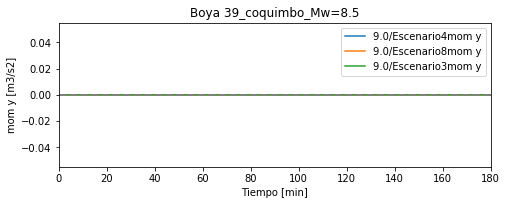

In [23]:
#mom_y
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        ux = base.variables['ux'][:].data
        uy = base.variables['uy'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        for k in range(0,time.shape[0]):
            texto2 = str(time[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        #plt.plot(time_i, (eta[:,i]-eta[:,i][0])*ux[:,i]*ux[:,i], label=j.split('=')[1].split('/layer01')[0]+'mom x')
        plt.plot(time_i, (eta[:,i]-eta[:,i][0])*uy[:,i]*uy[:,i], label=j.split('=')[1].split('/layer01')[0]+'mom y')
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-3,3))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_Mw=8.5')
        plt.xlabel('Tiempo [min]')
        plt.ylabel('mom y [m3/s2]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_mom_y+'/'+'Valpo_mom_y_Boya_'+str(i)+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_Mw=8.5')
        plt.xlabel('Tiempo [min]')
        plt.ylabel('mom y [m3/s2]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_mom_y+'/'+'Coquimbo_mom_y_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
        


/usr/lib/python2.7/dist-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


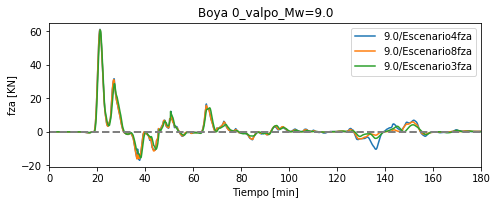

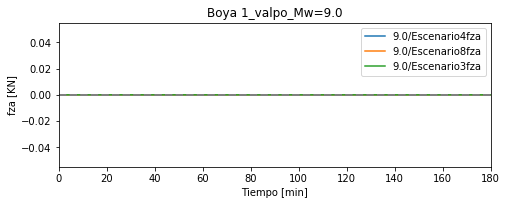

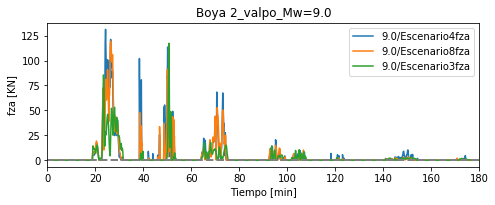

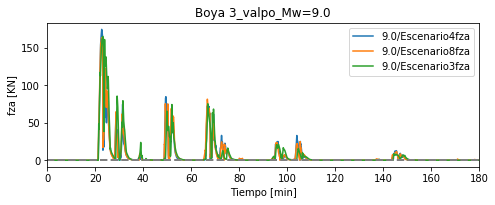

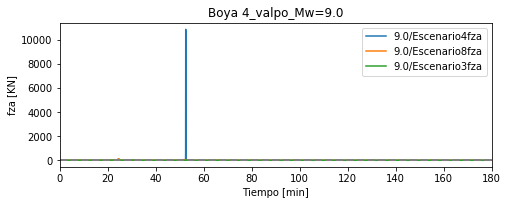

...

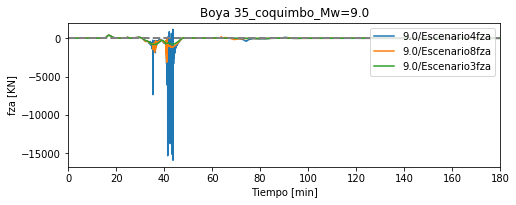

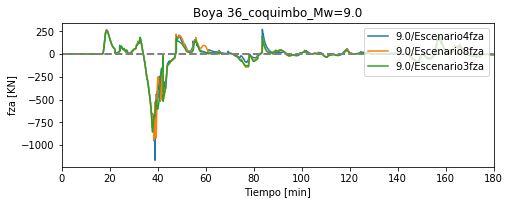

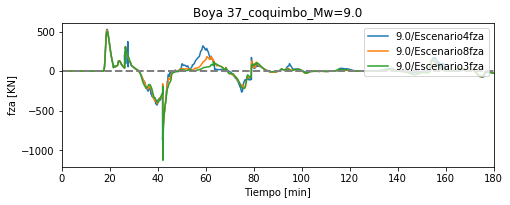

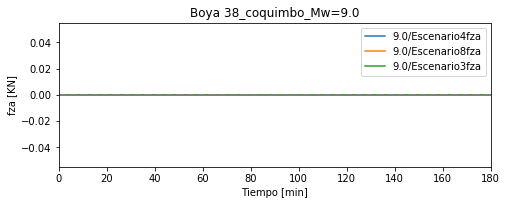

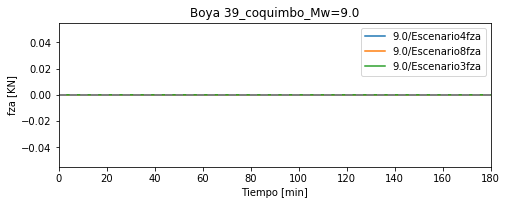

In [8]:
#fza
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        ux = base.variables['ux'][:].data
        uy = base.variables['uy'][:].data
        time = base.variables['time'][:].data
        time_i = np.zeros(time.shape[0])
        for k in range(0,time.shape[0]):
            texto2 = str(time[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        #plt.plot(time_i, (eta[:,i]-eta[:,i][0])*ux[:,i]*ux[:,i], label=j.split('=')[1].split('/layer01')[0]+'mom x')
        
        
        plt.plot(time_i, 1.2*(eta[:,i]-eta[:,i][0])*(ux[:,i]*ux[:,i]+uy[:,i]*uy[:,i]), label=j.split('=')[1].split('/layer01')[0]+'fza')
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-3,3))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_Mw=9.0')
        plt.xlabel('Tiempo [min]')
        plt.ylabel('fza [KN]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_fza+'/'+'Valpo_fza_Boya_'+str(i)+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_Mw=9.0')
        plt.xlabel('Tiempo [min]')
        plt.ylabel('fza [KN]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_fza+'/'+'Coquimbo_fza_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
        
